# Input Output Tests with Extended Waveset
To verify whether or not our amplitude model can handle higher order $J^P \ell$ partial waves, we can try fitting a Monte Carlo dataset that only contains a $b_1(1235)$ and $\rho(1450)$ (which we know previously to appear in the $S_0^{(+)}$ and $P_1^{(+)}$ partial waves). We of course then expect all other partial waves to be near 0. 

This procedure is better understood by employing a "bootstrapping" method. Once we have obtained the nominal fit parameters from performing repeated randomized fits, we perform another 100 fits all starting at the nominal fit parameters. Each bootstrap fit randomly samples the original dataset with replacement, and in doing so we can plot the distribution of those 100 fits for each fit parameter to get an estimate of its error. This is most easily visualized in a *grid plot* where the histograms, scatter plots, and kernel density estimations (kde's) show the distributions and relations of the data.

In practice we'll want to use the standard deviations of the bootstrap fits to obtain the uncertainties, but this file will be first studying the distributions to understand what metrics to employ

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math
import seaborn as sns

from pathlib import Path    
import sys, os
parent_dir = str(Path().resolve().parents[2])
sys.path.insert(0, parent_dir)
import analysis.scripts.pwa_tools as pwa_tools

# change some plot parameters to look better
plt.rcParams["figure.figsize"] = (10, 8)
plt.rcParams["figure.dpi"] = 500
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["legend.fontsize"] = 16
plt.rcParams["xtick.major.width"] = 2.0
plt.rcParams["xtick.minor.width"] = 1.8
plt.rcParams["ytick.major.width"] = 2.0
plt.rcParams["ytick.minor.width"] = 1.8
plt.rcParams["lines.markersize"] = 10 # bumped down from normal due to large mass range

## Prepare Data

In [2]:
path = f"{parent_dir}/analysis/input-output-tests/0m_1m_1p"

df = pd.read_csv(f"{path}/best_fits.csv", index_col="index")
df_data = pd.read_csv(f"{path}/data.csv")

# TEMP: the 1.6-1.62 bin just refuses to get a converged fit, so remove it
df_data.drop(30, inplace=True)
df_data.reset_index(drop=True, inplace=True)

df_bootstrap = pd.read_csv(f"{path}/bootstrap-fits_t_0.30-0.50.csv")
df_bootstrap["bin"].astype("int8")

df_truth = pd.read_csv(f"{path}/truth.csv", index_col="index")
df_truth.drop(30, inplace=True)
df_truth.reset_index(drop=True, inplace=True)

MASS_BINS = df_data["mass_mean"]
bin_width = (df_data["mass_high_edge"] - df_data["mass_low_edge"])[0]

# create the plotter object
plotter = pwa_tools.Plotter(df, df_data, df_bootstrap, df_truth)

## Analysis

### Non-bootstrap Plots

Lets first take a look at some of the standard plots from the fit results to see how they perform across the mass range

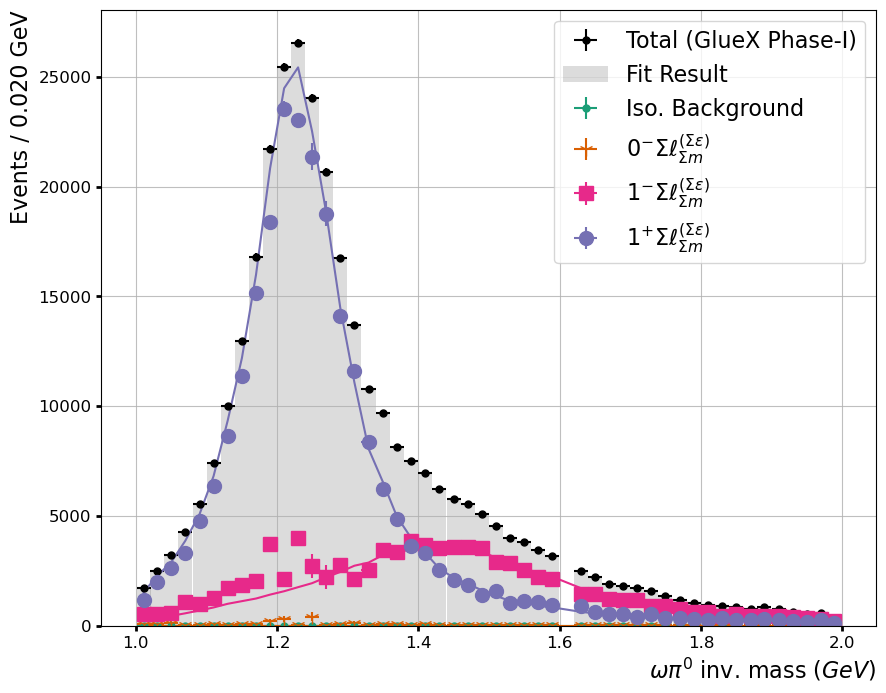

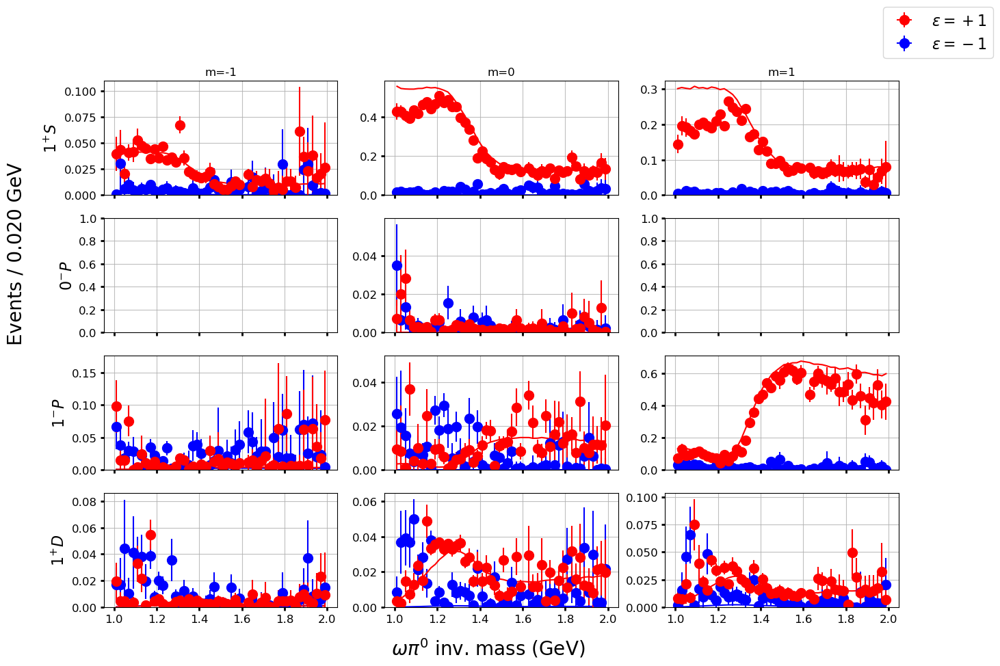

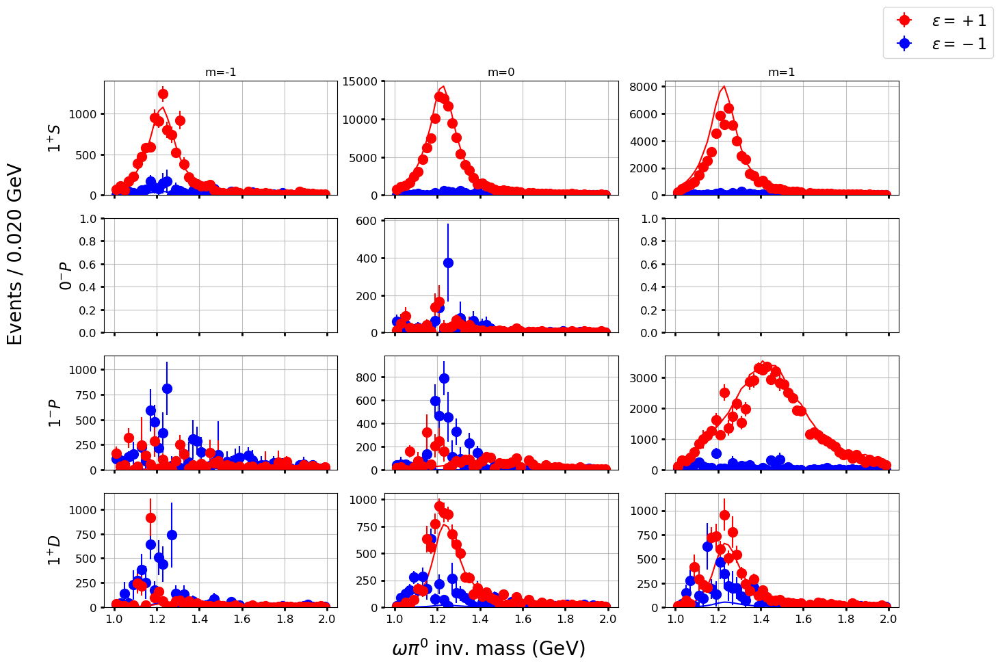

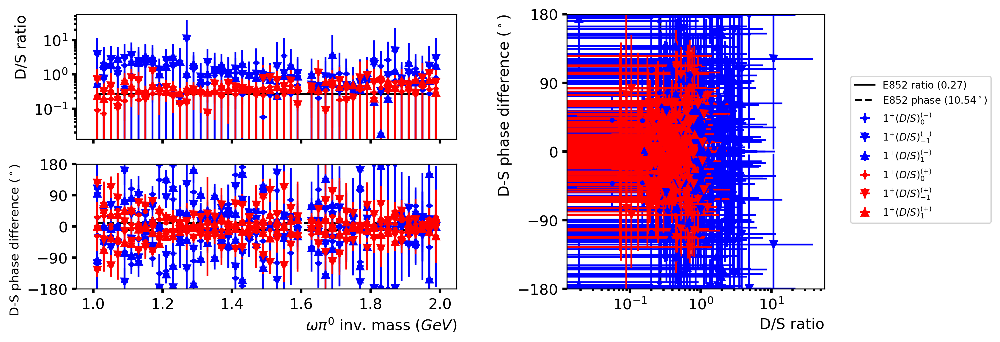

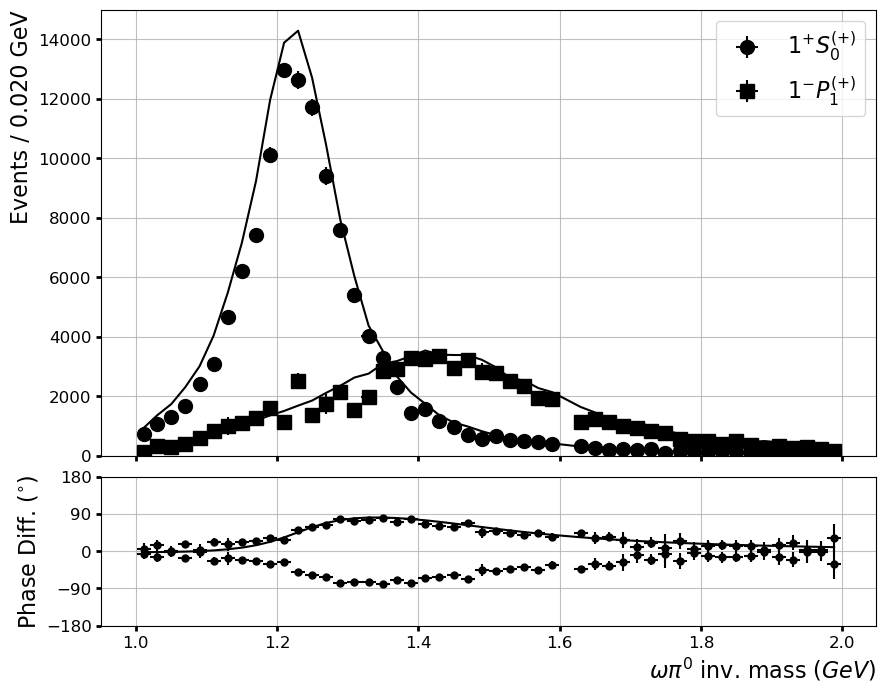

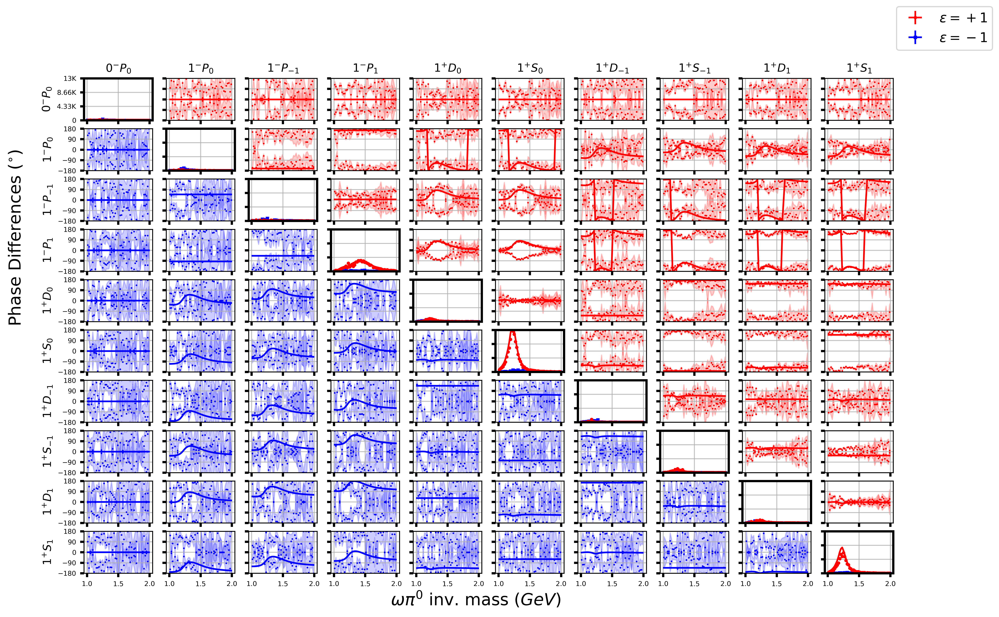

In [3]:
plotter.jp()
plotter.intensities(True, False)
plotter.intensities(False, False)
plotter.ds_ratio()
plotter.mass_phase("p1p0S", "p1mpP")
plotter.matrix()

Things seem to look okay for the most part, lets employ the power of our bootstrap fits to see if our main results (the $1^+ S_0^{(+)}$ and $1^- P_1^{(+)}$ interaction) has any correlations or issues. Lets pick 4 mass bins across the range to sample this. Lets do near threshold (1.0-1.02), the $b_1$ peak (1.22-1.24), the $\rho$ peak (1.44-1.46) and towards the end (1.8-1.82).

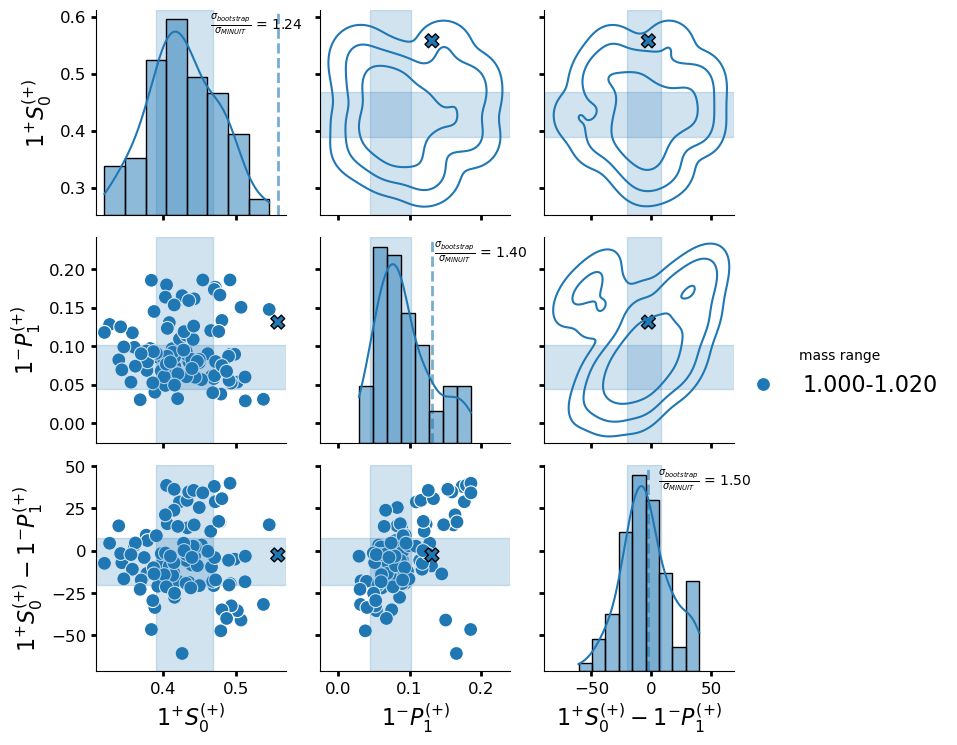

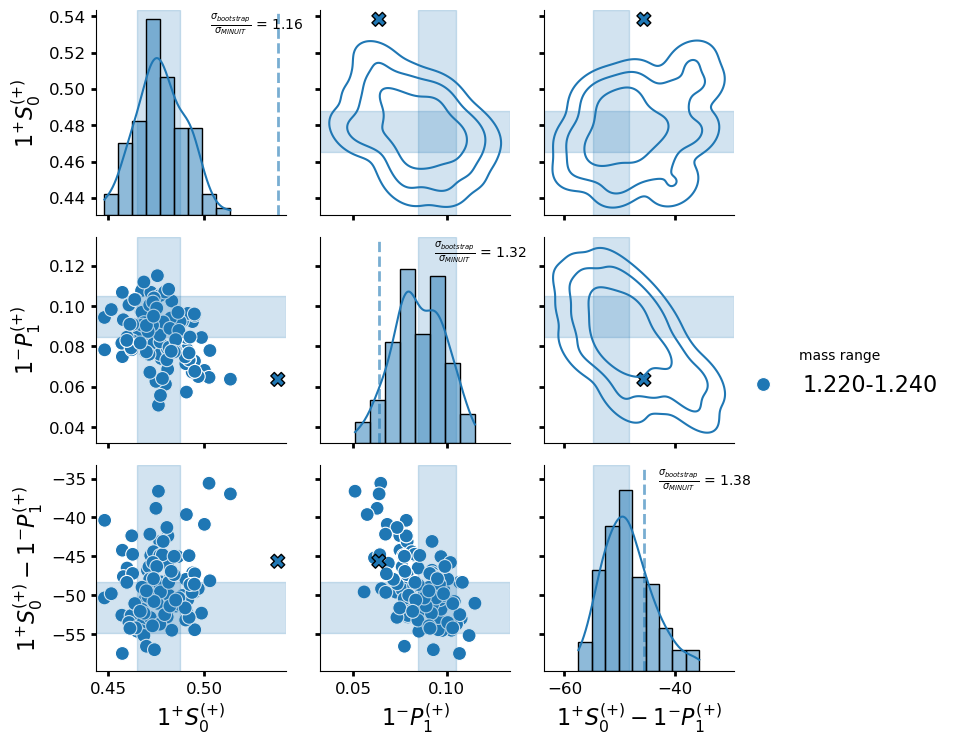

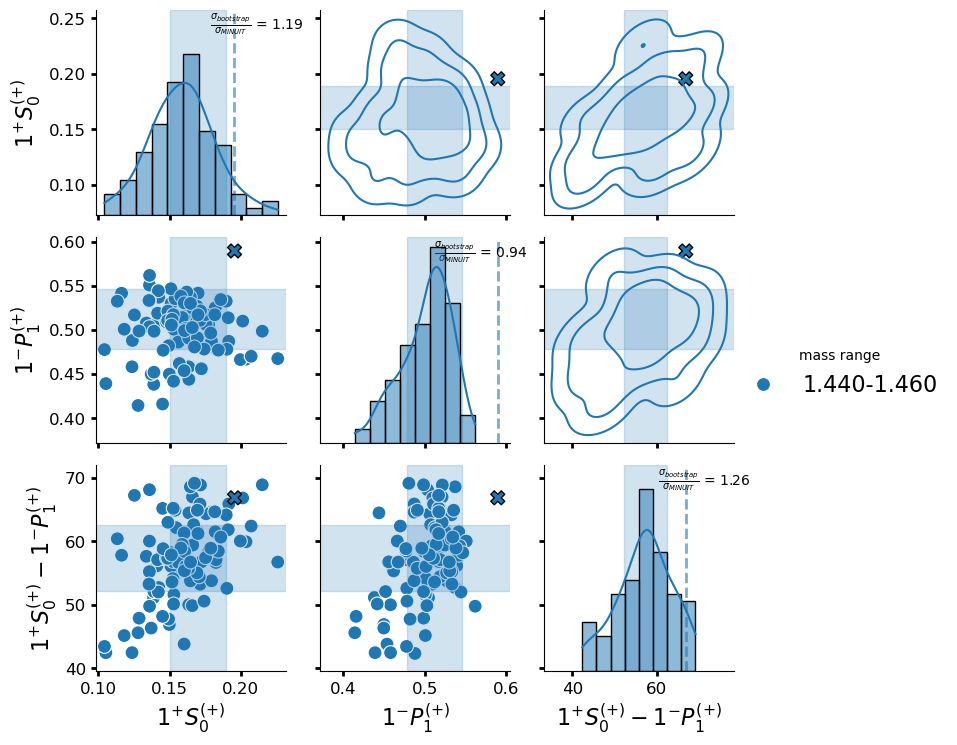

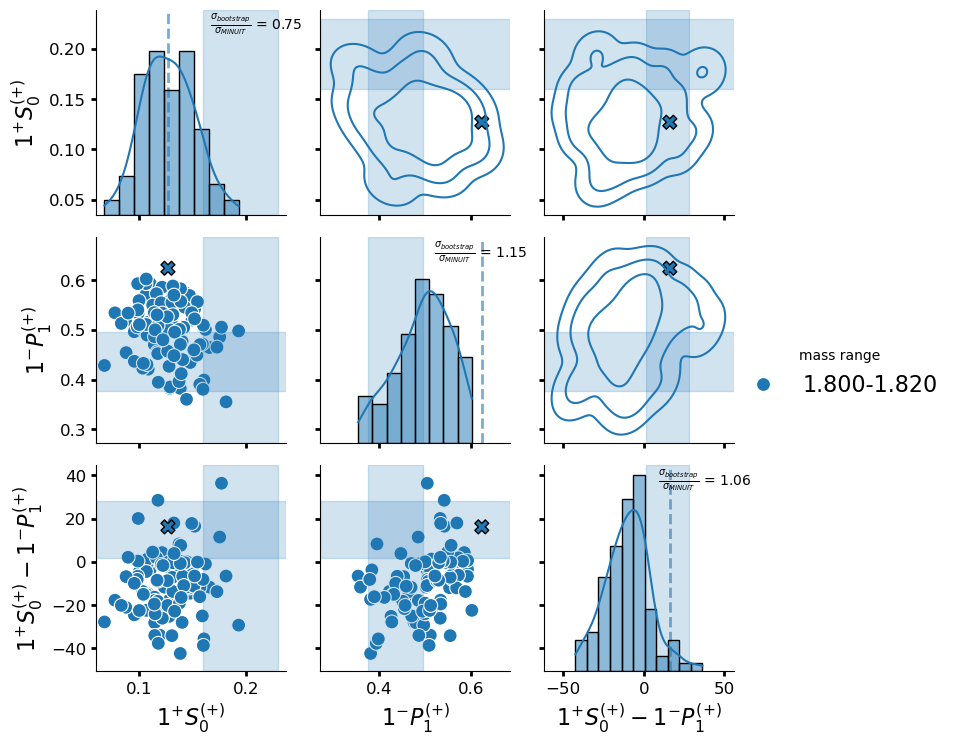

In [4]:
plotter.bootstrap_matrix([0], ["p1p0S", "p1mpP", plotter.phase_differences[("p1p0S", "p1mpP")]])
plotter.bootstrap_matrix([11], ["p1p0S", "p1mpP", plotter.phase_differences[("p1p0S", "p1mpP")]])
plotter.bootstrap_matrix([22], ["p1p0S", "p1mpP", plotter.phase_differences[("p1p0S", "p1mpP")]])
plotter.bootstrap_matrix([40], ["p1p0S", "p1mpP", plotter.phase_differences[("p1p0S", "p1mpP")]])

And lastly lets get a plot for presentation purposes to introduce people to grid plots

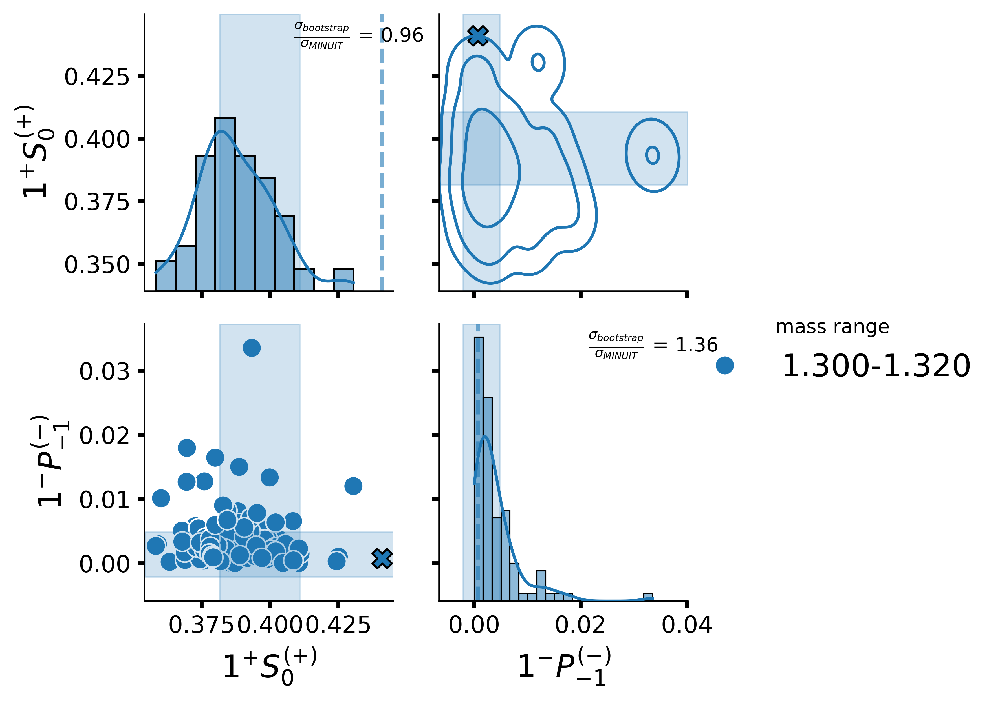

In [3]:
plotter.bootstrap_matrix([15], ["p1p0S", "m1mmP"])

### The 2 Problem Mass Bins
Clearly 2 mass bins are having issues, $m=[1.18-1.20]$ (bin 9) and $m=[1.22-1.24]$ (bin 11), though the mass bin between them looks fine. The angular distributions all look fine, and the rand fit diagnostics show that all other randomized fits are at least 1 unit of likelihood away with higher $\chi^2$ values.

#### Correlation Matrices
At this point lets check the correlations to see if any parameters in particular are the source of the instabilities here

['m0m0P', 'm1m0P', 'm1mmP', 'm1mpP', 'm1p0D', 'm1p0S', 'm1pmD', 'm1pmS', 'm1ppD', 'm1ppS', 'p0m0P', 'p1m0P', 'p1mmP', 'p1mpP', 'p1p0D', 'p1p0S', 'p1pmD', 'p1pmS', 'p1ppD', 'p1ppS']


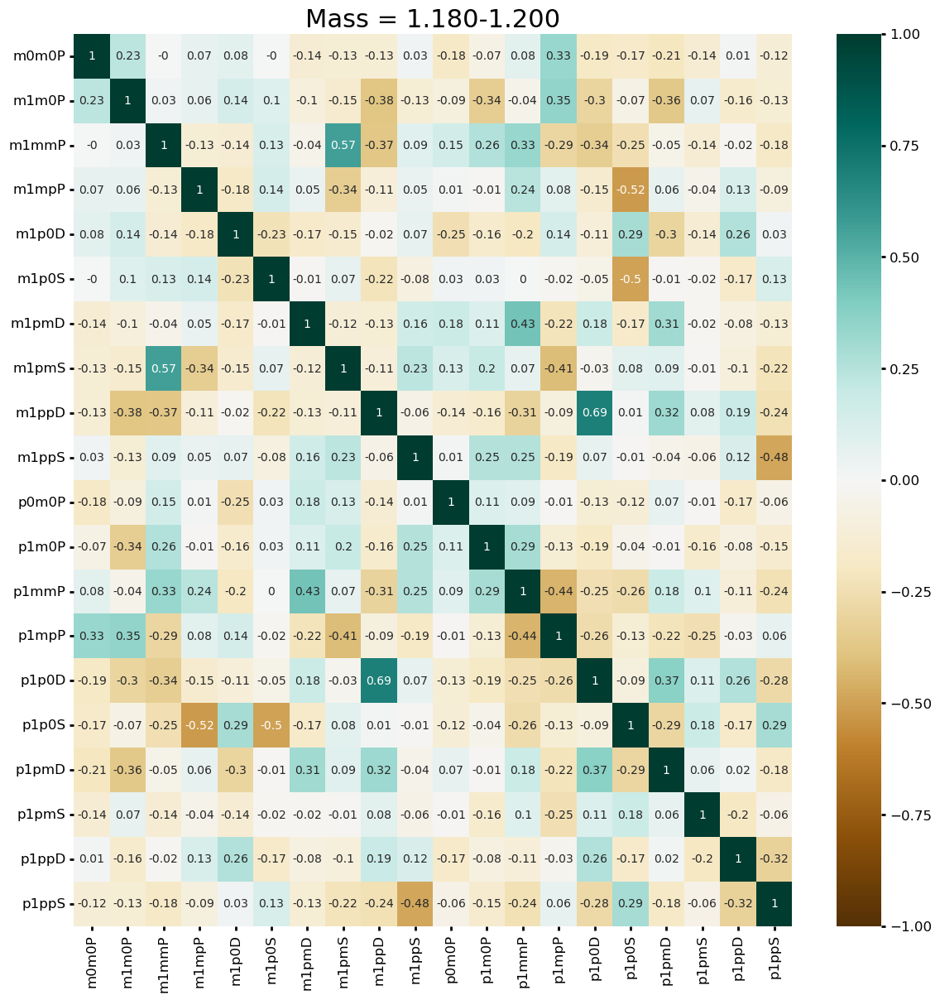

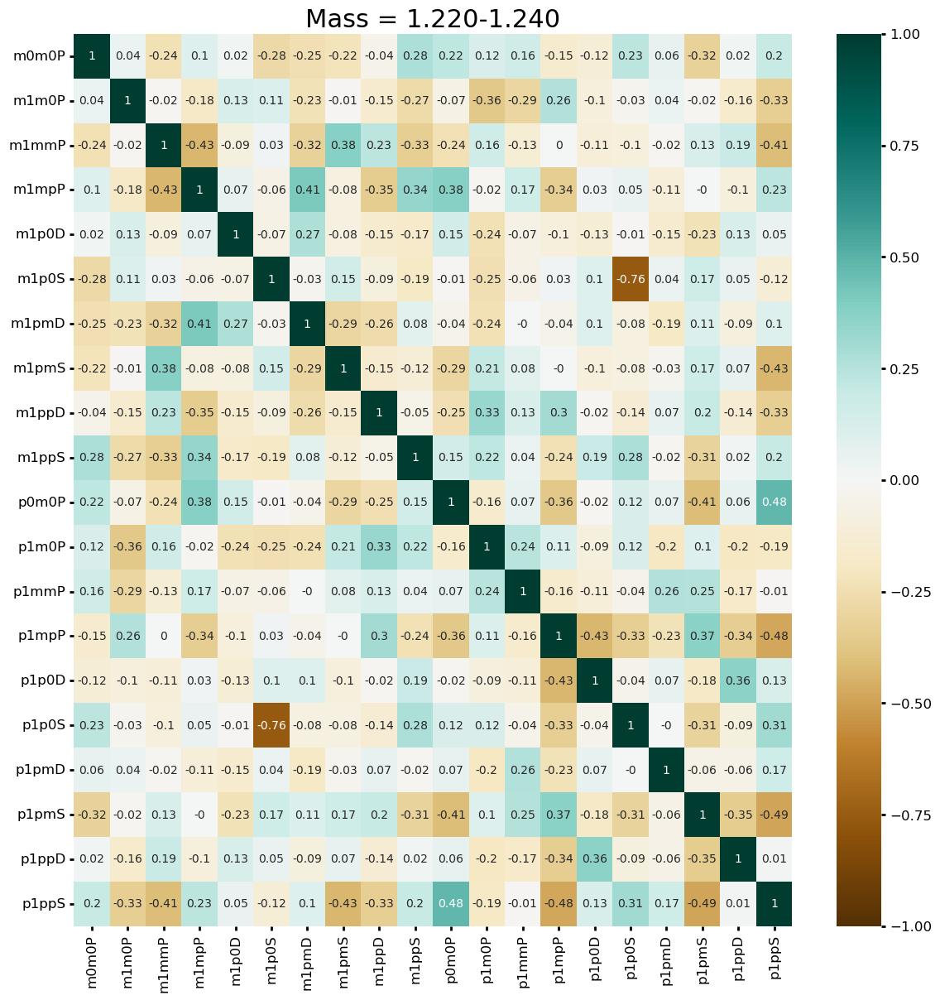

In [7]:
my_cols = plotter.coherent_sums["eJPmL"]

plt.figure(figsize=(14,14))
bin = 9
mass_range = plotter.bootstrap_df[plotter.bootstrap_df["bin"] == bin]["bin_range"].iloc[0]
heatmap = sns.heatmap(plotter.bootstrap_df[my_cols][plotter.bootstrap_df["bin"] == bin].corr().apply(lambda x: round(x,2)), vmin=-1.0, vmax=1.0, annot=True, cmap="BrBG")
heatmap.set_title(f"Mass = {mass_range}", fontdict={"fontsize":22})
plt.show()

plt.figure(figsize=(14,14))
bin = 11
mass_range = plotter.bootstrap_df[plotter.bootstrap_df["bin"] == bin]["bin_range"].iloc[0]
heatmap = sns.heatmap(plotter.bootstrap_df[my_cols][plotter.bootstrap_df["bin"] == bin].corr().apply(lambda x: round(x,2)), vmin=-1.0, vmax=1.0, annot=True, cmap="BrBG")
heatmap.set_title(f"Mass = {mass_range}", fontdict={"fontsize":22})
plt.show()

#### Bootstrap Plots
Nothing obviously stands out here, none of the coherent sums appear to have severe correlations. Lets first take a look at the coherent sums for total $J^P$ contribution for those 3 bins from the point of view of the bootstrap samples

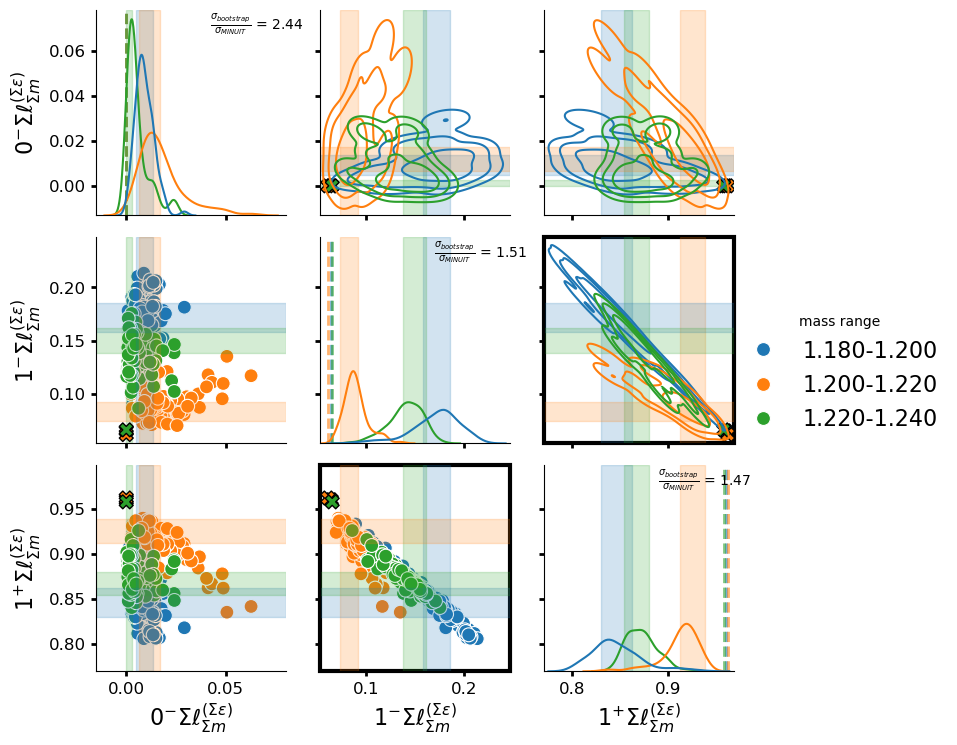

In [4]:
cols = [x for x in plotter.coherent_sums["JP"]]
plotter.bootstrap_matrix([9, 10, 11], cols) 

Now lets try looking at the bootstrap matrix for all the $P$ waves, both $0^-$ and $1^-$, since they discrepancies with the truth info

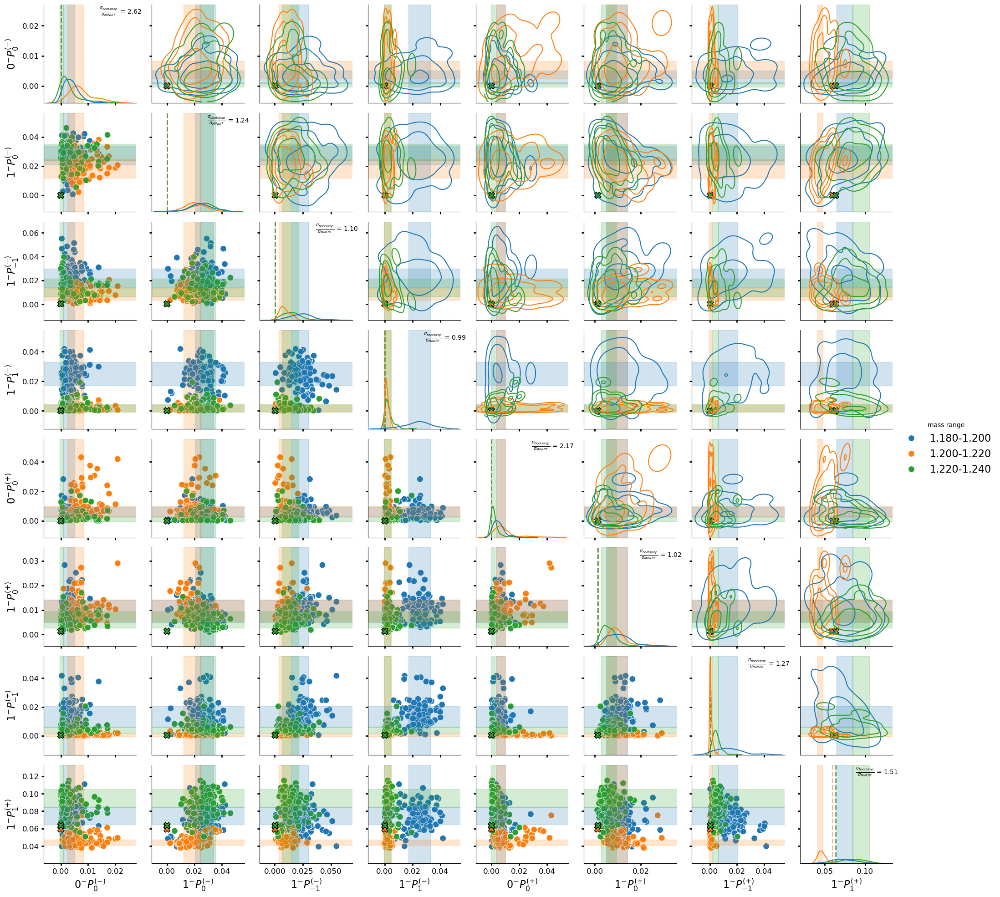

In [5]:
cols = [x for x in plotter.coherent_sums["eJPmL"] if x[-1]=="P"]
plotter.bootstrap_matrix([9, 10, 11], cols) 

As expected the negative reflectivities have some very wide MINUIT errors, which is good to see. The positive reflectivity waves all seem roughly similar too. Maybe the S and P waves are worth checking together 

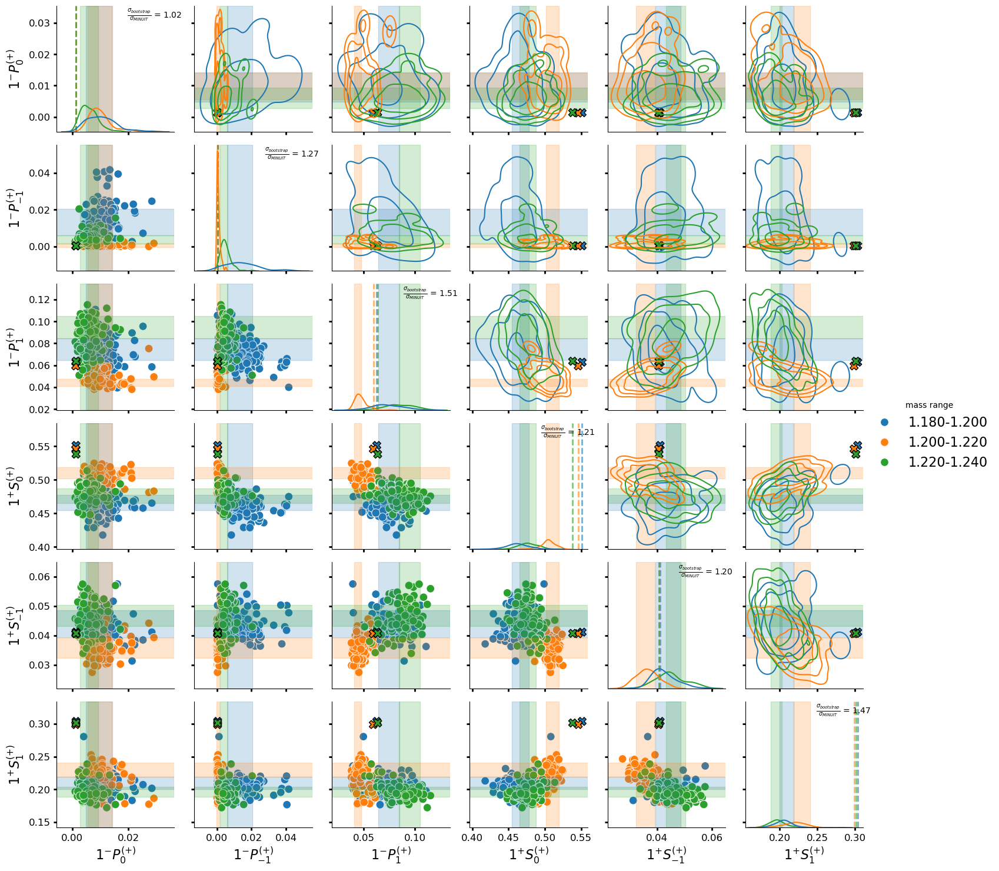

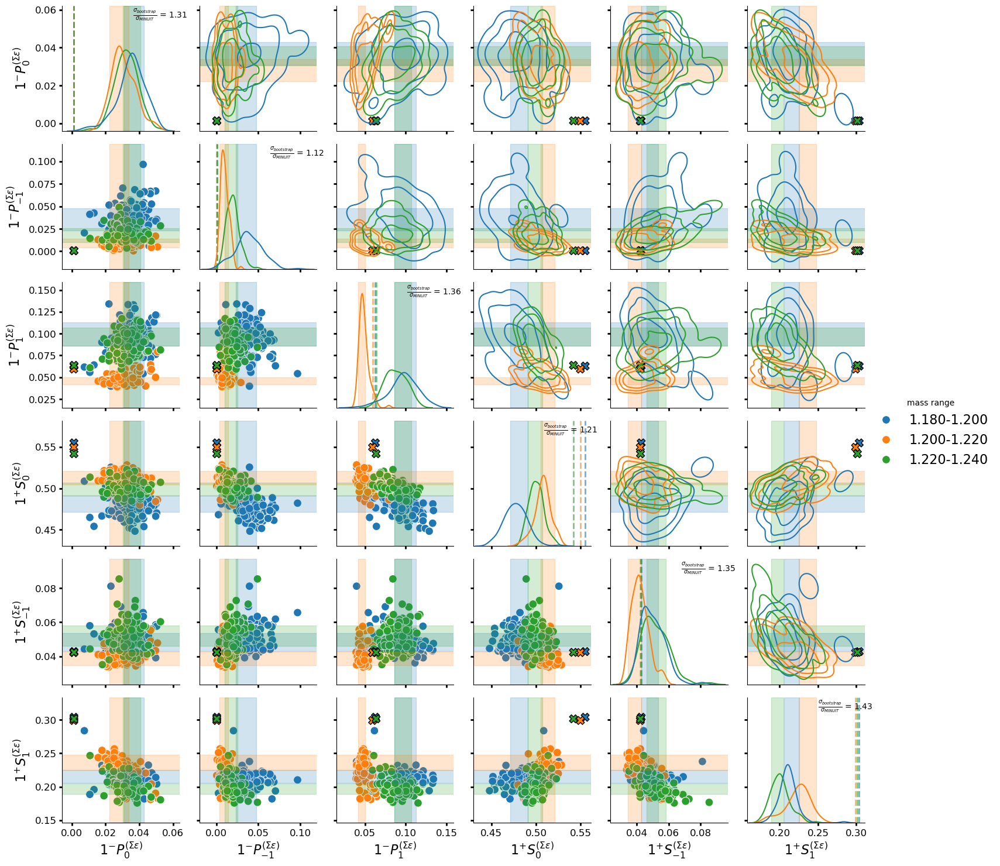

In [9]:
cols = [x for x in plotter.coherent_sums["eJPmL"] if x[0]=="p" and (x[1:3]=="1m" or x[-1]=="S")]
refl_cols = [x for x in plotter.coherent_sums["JPmL"] if (x[0:2]=="1m" or x[-1]=="S")]
plotter.bootstrap_matrix([9, 10, 11], cols) 
plotter.bootstrap_matrix([9, 10, 11], refl_cols) 


We can immediately see that the "good bin" has some characteristic distributions compared to the 2 bad bins. Lets hone in on those individual waves

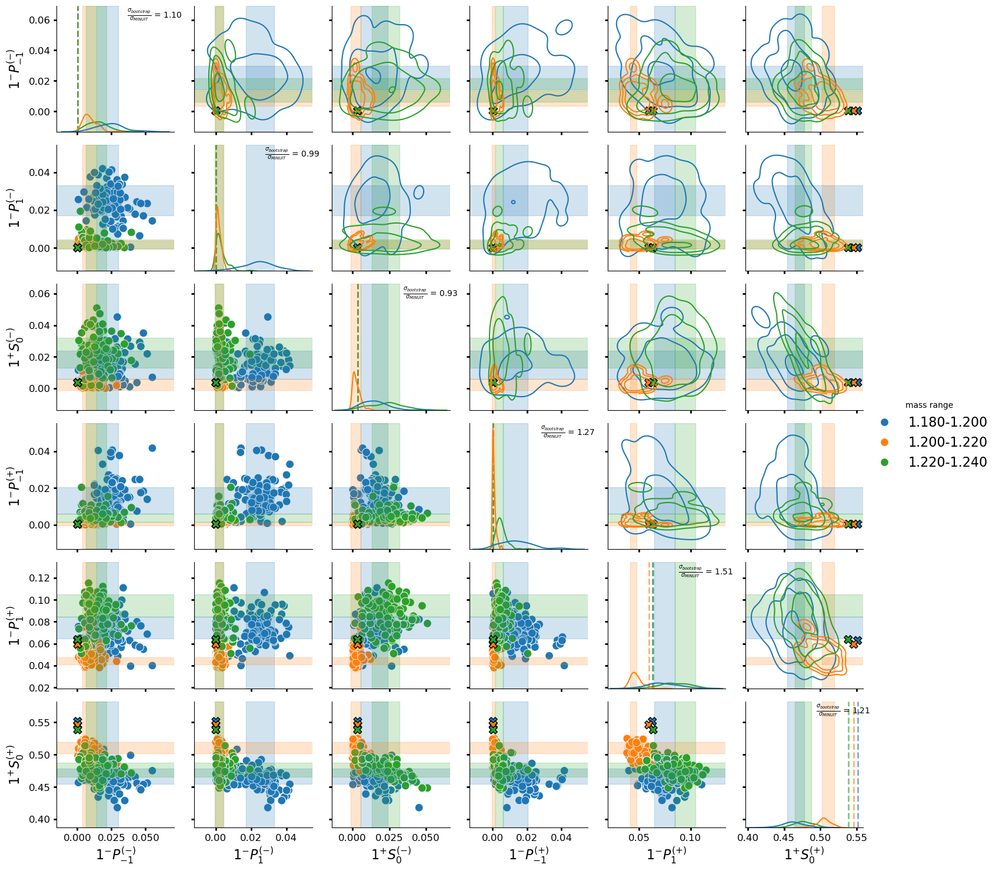

In [10]:
cols =[x for x in plotter.coherent_sums["eJPmL"] if (x[-1]=="S" and x[3]=="0") or (x[1:3]=="1m" and x[3]!="0")]
plotter.bootstrap_matrix([9, 10, 11], cols) 

We see the two bootstrap distributions of the bad bins to be extremely wide in some cases. Its also worth pointing out that even though no clear correlation exists, the models ability to correctly obtain the fit fractions of the $1^+S_0^{(+)}$, $1^-P_1^{(+)}$, and $1^-P_{-1}^{(+)}$ all seem very related to each other. This is worth performing a separate study on, where perhaps the $m=-1$ wave is removed from the $P$ wave to view its affect.

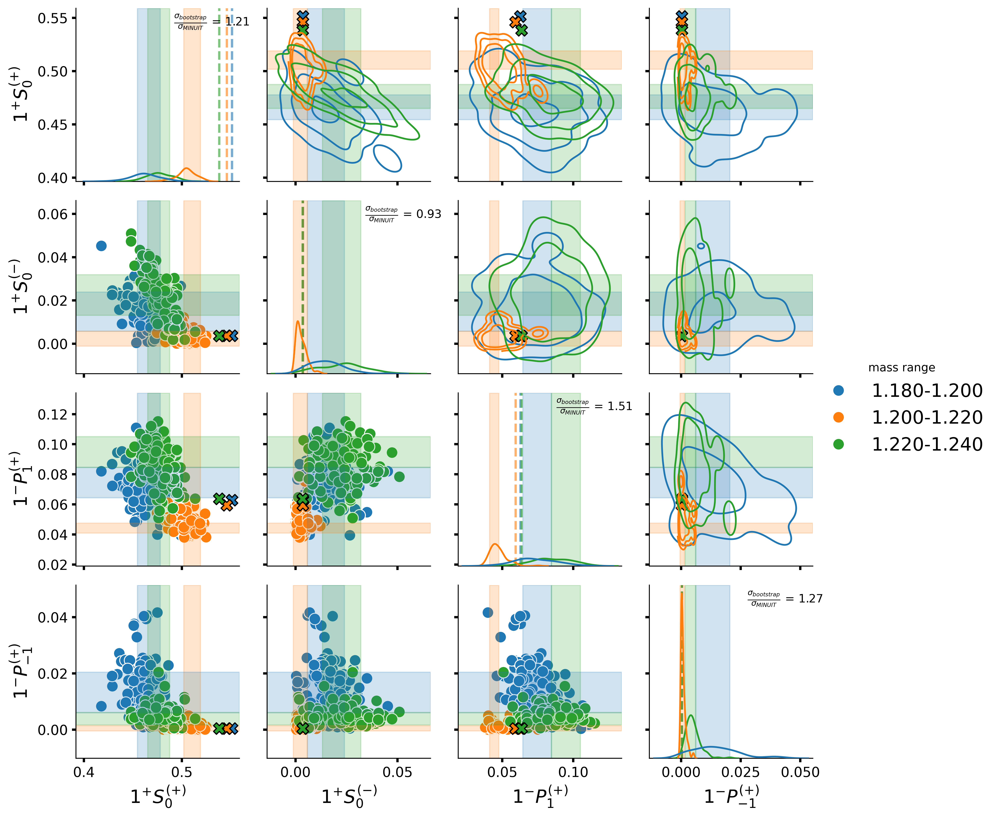

In [4]:
cols = ["p1p0S", "m1p0S", "p1mpP", "p1mmP"]
plotter.bootstrap_matrix([9, 10, 11], cols) 